In [1]:
options(repr.matrix.max.cols=60, repr.matrix.max.rows=100)

In [2]:
library(tidyverse)
library(ggplot2)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.6     ✔ purrr   0.3.4
✔ tibble  3.1.7     ✔ dplyr   1.0.9
✔ tidyr   1.2.0     ✔ stringr 1.4.0
✔ readr   2.1.2     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



In [3]:
plotdir <- '/home/kpettie/code/github/plotting'
source(file.path(plotdir,"plotting.R"))

fontdir <- '/cashew/shared_data/fonts'
extrafont::font_import(path=fontdir, prompt=FALSE)
extrafont::choose_font('Arial')

Scanning ttf files in /cashew/shared_data/fonts ...

Extracting .afm files from .ttf files...

/cashew/shared_data/fonts/ArialMT.ttf
 : ArialMT already registered in fonts database. Skipping.

Found FontName for 0 fonts.

Scanning afm files in /opt/modules/pkgs/R/4.1.0/lib/R/library/extrafontdb/metrics



[1] "Arial"

In [58]:
outdir <- '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/manuscript/figs/noCEU/supp'

In [18]:
filtScoresSummPairs <- function(scores,
                                score_column='ABC.Score',
                                cdt_col='ancestry',
                                cdt1='AFR',
                                cdt2='EUR',
                                groupvars=c('chr','start','end','class','TargetGene','TargetGeneTSS',
                                        'TargetGeneExpression','distance','isSelfPromoter','name',
                                        'TargetGeneIsExpressed'),
                                min_nonzero_hic=16) {

    scores <- scores %>%
        dplyr::rename(test.Score := {{score_column}},
                      condition := {{cdt_col}}) %>%
        dplyr::filter(!is.na(test.Score)) %>%
        group_by(across(all_of(groupvars))) %>%
        dplyr::filter(length(test.Score)==16,
                      sum(hic_contact > 0) >= min_nonzero_hic) %>%
        dplyr::rename(!!score_column := test.Score) %>%
        # removes downstream LFC outliers driven by a few samples with no ATAC
        # reads or with no HiC contacts in all other enhancers in 5 Mb window
        dplyr::filter(all(ABC.Score < 1),
                      all(activity_base > 0)) %>%
        dplyr::rename(test.Score := {{score_column}})

    pairsumm <- scores %>%
        summarize(test.Score_cdt1 = mean(test.Score[condition==cdt1]),
                  test.Score_cdt2 = mean(test.Score[condition==cdt2]),
                  sd_cdt1 = sd(test.Score[condition==cdt1]),
                  sd_cdt2 = sd(test.Score[condition==cdt2]),
                  n_cdt1 = sum(condition==cdt1),
                  n_cdt2 = sum(condition==cdt2)) %>%
        ungroup() %>%
        mutate(sdadj_cdt1 = if_else(sd_cdt1 < .2*test.Score_cdt1, .2*test.Score_cdt1, sd_cdt1),
               sdadj_cdt2 = if_else(sd_cdt2 < .2*test.Score_cdt2, .2*test.Score_cdt2, sd_cdt2),
               log2FoldChange = log2(test.Score_cdt2/test.Score_cdt1),
               gsea_stat = (test.Score_cdt2 - test.Score_cdt1)/sqrt(sdadj_cdt2/n_cdt2 + sdadj_cdt1/n_cdt1)) %>%
        dplyr::rename("{score_column}_{cdt1}" := test.Score_cdt1,
                      "{score_column}_{cdt2}" := test.Score_cdt2,
                      "sd_{cdt1}" := sd_cdt1,
                      "sd_{cdt2}" := sd_cdt2,
                      "n_{cdt1}" := n_cdt1,
                      "n_{cdt2}" := n_cdt2,
                      "sdadj_{cdt1}" := sdadj_cdt1,
                      "sdadj_{cdt2}" := sdadj_cdt2)

    scores <- scores %>%
        ungroup() %>%
        dplyr::rename(!!score_column := test.Score,
                      !!cdt_col := condition)

    return(list(scores=scores, pairSummary=pairsumm))

}

In [59]:
# abc_fname <- '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/270821output/diffABC/HiChIP/meanQN/debug/concatDecomp/allZerosFilt.meanQN.16.AFR_EUR.diff.ABC.Score.scoresAllSamps.txt.gz'
abc_fname <- '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/180922outputNoCEU/diffABC/HiChIP/allZerosFilt.meanQN.14.AFR_EUR.diff.chip.Score.scoresAllSampsFilt.txt.gz'
abc <- read_tsv(abc_fname)
head(abc)

Rows: 734356 Columns: 59
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (10): chr, class, TargetGene, name, CellType, sample, population, rep, q...
dbl (47): start, end, TargetGeneTSS, TargetGeneExpression, distance, powerla...
lgl  (2): isSelfPromoter, TargetGeneIsExpressed

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


chr,start,end,class,TargetGene,TargetGeneTSS,TargetGeneExpression,distance,isSelfPromoter,name,TargetGeneIsExpressed,powerlaw_contact,powerlaw_contact_reference,hic_contact,activity_base,atac.Score.Numerator,nEnh.atac,activity_base_sum,atac.Score,powerlaw.Score.Numerator,nEnh.ABC,powerlaw.Score,hic_enh_total,hic_tss_total,chip_estimate,nEnh.chip,chip_estimate_sum,chip_estimate_sum1,chip_estimate_adj,chip.Score,normalized_hic_contact,hic_contact_pl_scaled,hic_contact_sum,hic_contact_sum1,hic_contact_pl_scaled_adj,hic_estimate,hic_enh_total_sum,hic_tss_total_sum,hic_estimate_sum,hic_estimate_sum1,hic_estimate_adj,hic_estimate_adj_old,hic.Score.Numerator,nEnh.hic,hic.Score,activity_estimate,nEnh.activity,activity_estimate_sum,activity_estimate_sum1,activity_estimate_adj,activity.Score,ABC.Score.Numerator,ABC.Score,CellType,sample,population,rep,qnorm,ancestry
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,10003167,10003735,promoter,LZIC,10003485,7.781197,34.0,TRUE,promoter|chr1:10003167-10003735,TRUE,0.123436,0.123436,9,15.344302,15.344302,1845,2370.766,0.006472296,1.89403927,902,0.293603803,710.7143,710.7143,710.7143,1849,708389.8,0.0010032814,0.3746746,0.0010032814,23.214286,23.214286,414.7857,0.05596694,0.6250000,0.03266332,360751.6,641064.3,0.9070571,0.03601021,0.4166983,1.668114,0.4166983,902,0.03601021,104.42899,902,21071.88,0.004955845,0.4416026,0.004955845,9.5901888,0.21285003,ESN_rep1.meanQN,ESN_rep1,ESN,rep1,meanQN,AFR
chr1,10003167,10003735,promoter,NMNAT1,10003485,4.698655,34.0,TRUE,promoter|chr1:10003167-10003735,TRUE,0.123436,0.123436,9,15.344302,15.344302,1845,2370.766,0.006472296,1.89403927,902,0.293603803,710.7143,710.7143,710.7143,1849,708389.8,0.0010032814,0.3746746,0.0010032814,23.214286,23.214286,414.7857,0.05596694,0.6250000,0.03266332,360751.6,641064.3,0.9070571,0.03601021,0.4166983,1.668114,0.4166983,902,0.03601021,104.42899,902,21071.88,0.004955845,0.4416026,0.004955845,9.5901888,0.21285003,ESN_rep1.meanQN,ESN_rep1,ESN,rep1,meanQN,AFR
chr1,10003167,10003735,promoter,UBE4B,10093040,11.397529,89589.0,FALSE,promoter|chr1:10003167-10003735,TRUE,0.010027,0.010027,7,15.344302,15.344302,1852,2373.862,0.006463855,0.15385732,930,0.021007828,710.7143,746.7143,728.4919,1856,727678.4,0.0010011180,0.3746746,0.0010011180,17.785714,17.785714,353.3571,0.05033354,0.4901575,0.02441443,354520.4,694444.3,0.6935142,0.03520393,0.4061794,1.308222,0.4061794,930,0.03520393,105.72701,930,21303.77,0.004962830,0.4416026,0.004962830,7.5211244,0.13249508,ESN_rep1.meanQN,ESN_rep1,ESN,rep1,meanQN,AFR
chr1,10010314,10010817,genic,LZIC,10003485,7.781197,7080.5,FALSE,genic|chr1:10010314-10010817,TRUE,0.091204,0.091204,15,4.005388,4.005388,1845,2370.766,0.001689491,0.36530737,902,0.056627988,465.7857,710.7143,575.3612,1849,708389.8,0.0008122099,0.3033192,0.0008122099,37.142857,37.142857,414.7857,0.08954710,1.0000000,0.06455572,360751.6,641064.3,0.9070571,0.07117051,0.8235616,3.296857,0.8235616,902,0.07117051,48.00567,902,21071.88,0.002278186,0.2030033,0.002278186,4.0053876,0.08889782,ESN_rep1.meanQN,ESN_rep1,ESN,rep1,meanQN,AFR
chr1,10010314,10010817,genic,NMNAT1,10003485,4.698655,7080.5,FALSE,genic|chr1:10010314-10010817,TRUE,0.091204,0.091204,15,4.005388,4.005388,1845,2370.766,0.001689491,0.36530737,902,0.056627988,465.7857,710.7143,575.3612,1849,708389.8,0.0008122099,0.3033192,0.0008122099,37.142857,37.142857,414.7857,0.08954710,1.0000000,0.06455572,360751.6,641064.3,0.9070571,0.07117051,0.8235616,3.296857,0.8235616,902,0.07117051,48.00567,902,21071.88,0.002278186,0.2030033,0.002278186,4.0053876,0.08889782,ESN_rep1.meanQN,ESN_rep1,ESN,rep1,meanQN,AFR
chr1,10010314,10010817,genic,UBE4B,10093040,11.397529,82474.5,FALSE,genic|chr1:100

# supp table 2

In [99]:
abc_out <- abc %>% 
    select(sample,population,rep,ancestry,
           chr,start,end,class,name,TargetGene,TargetGeneTSS,distance,isSelfPromoter,
           ABC.Score,atac.Score,chip.Score,hic.Score) %>% 
    mutate(class = case_when(class=='promoter' ~ 'promoter',
                             class!='promoter' ~ 'enhancer')) %>% 
    rename(replicate=rep,
           CRE_type=class,
           ABC_score=ABC.Score,
           ATAC_score=atac.Score,
           ChIP_score=chip.Score,
           HiC_score=hic.Score)

head(abc_out)

sample,population,replicate,ancestry,chr,start,end,CRE_type,name,TargetGene,TargetGeneTSS,distance,isSelfPromoter,ABC_score,ATAC_score,ChIP_score,HiC_score
<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>
ESN_rep1,ESN,rep1,AFR,chr1,10003167,10003735,promoter,promoter|chr1:10003167-10003735,LZIC,10003485,34.0,TRUE,0.21285003,0.006472296,0.0010032814,0.03601021
ESN_rep1,ESN,rep1,AFR,chr1,10003167,10003735,promoter,promoter|chr1:10003167-10003735,NMNAT1,10003485,34.0,TRUE,0.21285003,0.006472296,0.0010032814,0.03601021
ESN_rep1,ESN,rep1,AFR,chr1,10003167,10003735,promoter,promoter|chr1:10003167-10003735,UBE4B,10093040,89589.0,FALSE,0.13249508,0.006463855,0.0010011180,0.03520393
ESN_rep1,ESN,rep1,AFR,chr1,10010314,10010817,enhancer,genic|chr1:10010314-10010817,LZIC,10003485,7080.5,FALSE,0.08889782,0.001689491,0.0008122099,0.07117051
ESN_rep1,ESN,rep1,AFR,chr1,10010314,10010817,enhancer,genic|chr1:10010314-10010817,NMNAT1,10003485,7080.5,FALSE,0.08889782,0.001689491,0.0008122099,0.07117051
ESN_rep1,ESN,rep1,AFR,chr1,10010314,10010817,enhancer,genic|chr1:10010314-10010817,UBE4B,10093040,82474.5,FALSE,0.01347316,0.001687287,0.0008104586,0.01694018


In [102]:
abc_out %>% 
    group_by(ancestry) %>% 
    summarize(N = n())

ancestry,N
<chr>,<int>
AFR,419632
EUR,314724


In [101]:
abc_out %>% 
    filter(ancestry=='AFR') %>% 
    write_tsv(
        file.path(
            '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/manuscript/data',
            'TableS2_allZerosFilt.meanQN.14.scoresAllSampsFilt.AFR.txt.gz'
        )
    )

abc_out %>% 
    filter(ancestry=='EUR') %>% 
    write_tsv(
        file.path(
            '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/manuscript/data',
            'TableS2_allZerosFilt.meanQN.14.scoresAllSampsFilt.EUR.txt.gz'
        )
    )

In [103]:
ceu_abc <- read_tsv('/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/manuscript/data/allZerosFilt.meanQN.16.AFR_EUR.diff.chip.Score.scoresAllSampsFilt.txt.gz') %>% 
    filter(population=='CEU')
ceu_abc

Rows: 807648 Columns: 53
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (10): chr, class, TargetGene, name, CellType, sample, population, rep, q...
dbl (41): start, end, TargetGeneTSS, TargetGeneExpression, distance, powerla...
lgl  (2): isSelfPromoter, TargetGeneIsExpressed

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


chr,start,end,class,TargetGene,TargetGeneTSS,TargetGeneExpression,distance,isSelfPromoter,name,TargetGeneIsExpressed,powerlaw_contact,powerlaw_contact_reference,hic_contact,activity_base,atac.Score.Numerator,nEnh.atac,activity_base_sum,atac.Score,powerlaw.Score.Numerator,nEnh.ABC,powerlaw.Score,hic_enh_total,hic_tss_total,chip_estimate,nEnh.chip,chip_estimate_sum,chip_estimate_sum1,chip_estimate_adj,chip.Score,normalized_hic_contact,hic_contact_pl_scaled,hic_contact_sum,hic_contact_sum1,hic_contact_pl_scaled_adj,hic_estimate,hic_enh_total_sum,hic_tss_total_sum,hic_estimate_sum,hic_estimate_sum1,hic_estimate_adj,hic_estimate_adj_old,hic.Score.Numerator,nEnh.hic,hic.Score,ABC.Score.Numerator,ABC.Score,CellType,sample,population,rep,qnorm,ancestry
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,10003167,10003735,promoter,LZIC,10003485,7.781197,34.0,TRUE,promoter|chr1:10003167-10003735,TRUE,0.123436,0.123436,52,17.1473898,17.1473898,1908,2412.7194,0.0071070800,2.116605205,966,0.3153370821,716.8750,716.8750,716.8750,1912,707767.25,0.001012868,0.4514388,0.001012868,35.4375,35.4375,527.2500,0.067211949,1.00000000,0.049433304,347948.50,692501.2,1.0744029,0.046010025,0.62025058,2.21513971,0.62025058,966,0.046010025,17.1473898,0.290615116,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,10003167,10003735,promoter,NMNAT1,10003485,4.698655,34.0,TRUE,promoter|chr1:10003167-10003735,TRUE,0.123436,0.123436,52,17.1473898,17.1473898,1908,2412.7194,0.0071070800,2.116605205,966,0.3153370821,716.8750,716.8750,716.8750,1912,707767.25,0.001012868,0.4514388,0.001012868,35.4375,35.4375,527.2500,0.067211949,1.00000000,0.049433304,347948.50,692501.2,1.0744029,0.046010025,0.62025058,2.21513971,0.62025058,966,0.046010025,17.1473898,0.290615116,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,10003167,10003735,promoter,UBE4B,10093040,11.397529,89589.0,FALSE,promoter|chr1:10003167-10003735,TRUE,0.010027,0.010027,16,17.1473898,17.1473898,1915,2419.0477,0.0070884876,0.171936877,989,0.0239315132,716.8750,624.5625,669.1287,1919,662926.15,0.001009356,0.4514388,0.001009356,10.9375,10.9375,421.1875,0.025968245,0.28317152,0.016345883,347581.78,617692.3,0.9081677,0.017998749,0.26438407,0.62726448,0.26438407,989,0.017998749,4.8556524,0.096686556,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,10010314,10010816,genic,LZIC,10003485,7.781197,7080.0,FALSE,genic|chr1:10010314-10010816,TRUE,0.091209,0.091209,43,3.7332441,3.7332441,1908,2412.7194,0.0015473180,0.340505463,966,0.0507293467,733.2500,716.8750,725.0163,1912,707767.25,0.001024371,0.4565656,0.001024371,31.3125,31.3125,527.2500,0.059388336,0.88359788,0.043188686,347948.50,692501.2,1.0744029,0.040197849,0.54189798,1.93531415,0.54189798,966,0.040197849,3.2986866,0.055906363,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,10010314,10010816,genic,NMNAT1,10003485,4.698655,7080.0,FALSE,genic|chr1:10010314-10010816,TRUE,0.091209,0.091209,43,3.7332441,3.7332441,1908,2412.7194,0.0015473180,0.340505463,966,0.0507293467,733.2500,716.8750,725.0163,1912,707767.25,0.001024371,0.4565656,0.001024371,31.3125,31.3125,527.2500,0.059388336,0.88359788,0.043188686,347948.50,692501.2,1.0744029,0.040197849,0.54189798,1.93531415,0.54189798,966,0.040197849,3.2986866,0.055906363,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,10010314,10010816,genic,UBE4B,10093040,11.397529,82475.0,FALSE,genic|chr1:10010314-10010816,TRUE,0.010775,0.010775,23,3.7332441,3.7332441,1915,2419.0477,0.0015432701,0.040225705,989,0.0055989269,733.2500,624.5625,676.7278,1919,662926.15,0.001020819,0.4565656,0.001020819,16.3125,16.3125,421.1875,0.038729782,0.42233010,0.024104967,347581.78,617692.3,0.9081677,0.026542417,0.38988222,0.92501513,0.38988222,989,0.026542417,1.5766614,0.031394742,CE

In [104]:
ceu_abc <- ceu_abc %>% 
    select(sample,population,rep,ancestry,
           chr,start,end,class,name,TargetGene,TargetGeneTSS,distance,isSelfPromoter,
           ABC.Score,atac.Score,chip.Score,hic.Score) %>% 
    mutate(class = case_when(class=='promoter' ~ 'promoter',
                             class!='promoter' ~ 'enhancer')) %>% 
    rename(replicate=rep,
           CRE_type=class,
           ABC_score=ABC.Score,
           ATAC_score=atac.Score,
           ChIP_score=chip.Score,
           HiC_score=hic.Score)
ceu_abc

sample,population,replicate,ancestry,chr,start,end,CRE_type,name,TargetGene,TargetGeneTSS,distance,isSelfPromoter,ABC_score,ATAC_score,ChIP_score,HiC_score
<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>
CEU_rep1,CEU,rep1,EUR,chr1,10003167,10003735,promoter,promoter|chr1:10003167-10003735,LZIC,10003485,34.0,TRUE,0.290615116,0.0071070800,0.001012868,0.046010025
CEU_rep1,CEU,rep1,EUR,chr1,10003167,10003735,promoter,promoter|chr1:10003167-10003735,NMNAT1,10003485,34.0,TRUE,0.290615116,0.0071070800,0.001012868,0.046010025
CEU_rep1,CEU,rep1,EUR,chr1,10003167,10003735,promoter,promoter|chr1:10003167-10003735,UBE4B,10093040,89589.0,FALSE,0.096686556,0.0070884876,0.001009356,0.017998749
CEU_rep1,CEU,rep1,EUR,chr1,10010314,10010816,enhancer,genic|chr1:10010314-10010816,LZIC,10003485,7080.0,FALSE,0.055906363,0.0015473180,0.001024371,0.040197849
CEU_rep1,CEU,rep1,EUR,chr1,10010314,10010816,enhancer,genic|chr1:10010314-10010816,NMNAT1,10003485,7080.0,FALSE,0.055906363,0.0015473180,0.001024371,0.040197849
CEU_rep1,CEU,rep1,EUR,chr1,10010314,10010816,enhancer,genic|chr1:10010314-10010816,UBE4B,10093040,82475.0,FALSE,0.031394742,0.0015432701,0.001020819,0.026542417
CEU_rep1,CEU,rep1,EUR,chr1,100215450,100215965,enhancer,genic|chr1:100215450-100215965,FRRS1,100231349,15641.5,FALSE,0.060237944,0.0037786470,0.004280193,NA
CEU_rep1,CEU,rep1,EUR,chr1,100217620,100218122,enhancer,genic|chr1:100217620-100218122,FRRS1,100231349,13478.0,FALSE,0.104084495,0.0065290836,0.004280193,NA
CEU_rep1,CEU,rep1,EUR,chr1,100223560,100224117,enhancer,genic|chr1:100223560-100224117,FRRS1,100231349,7510.5,FALSE,0.014457049,0.0029110581,0.001939685,NA


In [105]:
ceu_abc %>% 
    write_tsv(
        file.path(
            '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/manuscript/data',
            'TableS2_allZerosFilt.meanQN.16.scoresAllSampsFilt.CEU.txt.gz'
        )
    )

# supp table 3

In [106]:
dabc_fname <- '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/180922outputNoCEU/diffABC/HiChIP/aggregate/allZerosFilt.meanQN.14.AFR_EUR.diff.allComponents.txt.gz'
dabc <- read_tsv(dabc_fname)
dabc

Rows: 209816 Columns: 34
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (9): seqnames, strand, class, TargetGene, name, group1, group2, score_t...
dbl (22): start, end, width, TargetGeneTSS, TargetGeneExpression, distance, ...
lgl  (3): isSelfPromoter, TargetGeneIsExpressed, selection_candidate

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


seqnames,start,end,width,strand,class,TargetGene,TargetGeneTSS,TargetGeneExpression,distance,isSelfPromoter,name,TargetGeneIsExpressed,Score_AFR,Score_EUR,n_AFR,n_EUR,log2FoldChange,gsea_stat,group1,group2,n1,n2,p,score_type,RSNUM,max_abs_ihs,rank2_abs_ihs,rank2_percentile,selection_candidate,ihs_pos,FST,fst_percentile,FST_pos
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>
chr19,58838084,58838864,781,*,promoter,A1BG,58864865,1.819925,26391.0,FALSE,promoter|chr19:58838084-58838864,TRUE,0.109660759,0.12721517,8,6,0.214223383,0.156211079,AFR,EUR,8,6,0.4700,ABC,rs60121895,1.553,1.381,0.8370710,FALSE,58838509,0.07591060,0.8702811,58838509
chr19,58873687,58874546,860,*,promoter,A1BG,58864865,1.819925,9251.5,FALSE,promoter|chr19:58873687-58874546,TRUE,0.325822394,0.30436753,8,6,-0.098271302,-0.138140004,AFR,EUR,8,6,0.6460,ABC,rs145521824,1.399,0.940,0.6576563,FALSE,58873694,0.10197300,0.9011235,58874262
chr19,58838084,58838864,781,*,promoter,A1BG-AS1,58863335,NA,24861.0,FALSE,promoter|chr19:58838084-58838864,FALSE,0.109660759,0.12721517,8,6,0.214223383,0.156211079,AFR,EUR,8,6,0.4700,ABC,rs60121895,1.553,1.381,0.8370710,FALSE,58838509,0.07591060,0.8702811,58838509
chr19,58873687,58874546,860,*,promoter,A1BG-AS1,58863335,NA,10781.5,FALSE,promoter|chr19:58873687-58874546,FALSE,0.325822394,0.30436753,8,6,-0.098271302,-0.138140004,AFR,EUR,8,6,0.6460,ABC,rs145521824,1.399,0.940,0.6576563,FALSE,58873694,0.10197300,0.9011235,58874262
chr12,9255999,9256500,502,*,genic,A2M,9268825,0.095923,12575.5,FALSE,genic|chr12:9255999-9256500,FALSE,0.027001601,0.03554471,8,6,0.396589894,0.093062579,AFR,EUR,8,6,0.6110,ABC,rs226391,1.123,1.113,0.7392141,FALSE,9256354,0.19828700,0.9564241,9256255
chr12,9270663,9271300,638,*,intergenic,A2M,9268825,0.095923,2156.5,FALSE,intergenic|chr12:9270663-9271300,FALSE,0.143662575,0.12375653,8,6,-0.215179604,-0.121969177,AFR,EUR,8,6,0.6970,ABC,rs76971454,1.748,1.057,0.7144360,FALSE,9270897,0.07319840,0.8657801,9270989
chr22,43116666,43117166,501,*,promoter,A4GALT,43116916,9.755513,0.0,TRUE,promoter|chr22:43116666-43117166,TRUE,0.327771139,0.32976098,8,6,0.008731885,0.009003971,AFR,EUR,8,6,0.9830,ABC,rs28910284,2.265,2.051,0.9602735,TRUE,43116989,0.23220200,0.9662657,43116817
chr17,31860529,31861029,501,*,promoter,AA06,31860779,NA,0.0,TRUE,promoter|chr17:31860529-31861029,FALSE,0.010867865,0.03567143,8,6,1.714700391,0.257397119,AFR,EUR,8,6,0.2730,ABC,rs9892263,2.319,1.624,0.8987944,FALSE,31860994,0.45702400,0.9942746,31860994
chr12,53886720,53887220,501,*,genic,AAAS,53715412,24.203783,171558.0,FALSE,genic|chr12:53886720-53887220,TRUE,0.017134852,0.01934447,8,6,0.174987512,0.053523103,AFR,EUR,8,6,0.5190,ABC,rs57408986,2.095,1.934,0.9480888,FALSE,53886789,0.04269980,0.8003230,53886755


In [109]:
dabc_out <- dabc %>% 
    select(seqnames,start,end,class,name,TargetGene,TargetGeneTSS,distance,isSelfPromoter,
           Score_AFR, Score_EUR, n_AFR, n_EUR, log2FoldChange, gsea_stat, p, score_type) %>% 
    mutate(class = case_when(class=='promoter' ~ 'promoter',
                             class!='promoter' ~ 'enhancer'),
           score_type = case_when(score_type=='ABC' ~ 'ABC',
                                  score_type=='atac' ~ 'ATAC',
                                  score_type=='chip' ~ 'ChIP',
                                  score_type=='hic' ~ 'HiC')) %>% 
    rename(chr=seqnames,
           CRE_type=class)
dabc_out

chr,start,end,CRE_type,name,TargetGene,TargetGeneTSS,distance,isSelfPromoter,Score_AFR,Score_EUR,n_AFR,n_EUR,log2FoldChange,gsea_stat,p,score_type
<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
chr19,58838084,58838864,promoter,promoter|chr19:58838084-58838864,A1BG,58864865,26391.0,FALSE,0.109660759,0.12721517,8,6,0.214223383,0.156211079,0.4700,ABC
chr19,58873687,58874546,promoter,promoter|chr19:58873687-58874546,A1BG,58864865,9251.5,FALSE,0.325822394,0.30436753,8,6,-0.098271302,-0.138140004,0.6460,ABC
chr19,58838084,58838864,promoter,promoter|chr19:58838084-58838864,A1BG-AS1,58863335,24861.0,FALSE,0.109660759,0.12721517,8,6,0.214223383,0.156211079,0.4700,ABC
chr19,58873687,58874546,promoter,promoter|chr19:58873687-58874546,A1BG-AS1,58863335,10781.5,FALSE,0.325822394,0.30436753,8,6,-0.098271302,-0.138140004,0.6460,ABC
chr12,9255999,9256500,enhancer,genic|chr12:9255999-9256500,A2M,9268825,12575.5,FALSE,0.027001601,0.03554471,8,6,0.396589894,0.093062579,0.6110,ABC
chr12,9270663,9271300,enhancer,intergenic|chr12:9270663-9271300,A2M,9268825,2156.5,FALSE,0.143662575,0.12375653,8,6,-0.215179604,-0.121969177,0.6970,ABC
chr22,43116666,43117166,promoter,promoter|chr22:43116666-43117166,A4GALT,43116916,0.0,TRUE,0.327771139,0.32976098,8,6,0.008731885,0.009003971,0.9830,ABC
chr17,31860529,31861029,promoter,promoter|chr17:31860529-31861029,AA06,31860779,0.0,TRUE,0.010867865,0.03567143,8,6,1.714700391,0.257397119,0.2730,ABC
chr12,53886720,53887220,enhancer,genic|chr12:53886720-53887220,AAAS,53715412,171558.0,FALSE,0.017134852,0.01934447,8,6,0.174987512,0.053523103,0.5190,ABC


In [115]:
?write_tsv

In [118]:
colinfo <- c('## distance = absolute distance between target gene TSS and CRE midpoint',
             '## isSelfPromoter = TRUE if CRE is the promoter of its target gene',
             '## Score_AFR = mean score among AFR samples',
             '## Score_EUR = mean score among EUR samples',
             '## n_AFR = number of AFR samples',
             '## n_EUR = number of EUR samples',
             '## log2FoldChange = log2(Score_EUR/Score_AFR)',
             "## gsea_stat = gene set enrichment analysis ranking statistic (see Methods under 'GO analysis')",
             "## p = P-value from unpaired, two-sample t-test on AFR versus EUR sample scores",
             "## score_type = score type used to calculate statistics in each row",
             "## ")

dabcoutname <- file.path(
            '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/manuscript/data',
            'TableS3_allZerosFilt.meanQN.14.AFR_EUR.diff.allComponents.txt'
        )

writeLines(colinfo, 
           dabcoutname)

dabc_out %>% 
    write_tsv(
        dabcoutname,
        append=TRUE,
        col_names=TRUE
    )

# PCA function

In [60]:
head(abc, 4)

chr,start,end,class,TargetGene,TargetGeneTSS,TargetGeneExpression,distance,isSelfPromoter,name,TargetGeneIsExpressed,powerlaw_contact,powerlaw_contact_reference,hic_contact,activity_base,atac.Score.Numerator,nEnh.atac,activity_base_sum,atac.Score,powerlaw.Score.Numerator,nEnh.ABC,powerlaw.Score,hic_enh_total,hic_tss_total,chip_estimate,nEnh.chip,chip_estimate_sum,chip_estimate_sum1,chip_estimate_adj,chip.Score,normalized_hic_contact,hic_contact_pl_scaled,hic_contact_sum,hic_contact_sum1,hic_contact_pl_scaled_adj,hic_estimate,hic_enh_total_sum,hic_tss_total_sum,hic_estimate_sum,hic_estimate_sum1,hic_estimate_adj,hic_estimate_adj_old,hic.Score.Numerator,nEnh.hic,hic.Score,activity_estimate,nEnh.activity,activity_estimate_sum,activity_estimate_sum1,activity_estimate_adj,activity.Score,ABC.Score.Numerator,ABC.Score,CellType,sample,population,rep,qnorm,ancestry
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,10003167,10003735,promoter,LZIC,10003485,7.781197,34.0,TRUE,promoter|chr1:10003167-10003735,TRUE,0.123436,0.123436,9,15.344302,15.344302,1845,2370.766,0.006472296,1.8940393,902,0.29360380,710.7143,710.7143,710.7143,1849,708389.8,0.0010032814,0.3746746,0.0010032814,23.21429,23.21429,414.7857,0.05596694,0.6250000,0.03266332,360751.6,641064.3,0.9070571,0.03601021,0.4166983,1.668114,0.4166983,902,0.03601021,104.42899,902,21071.88,0.004955845,0.4416026,0.004955845,9.590189,0.21285003,ESN_rep1.meanQN,ESN_rep1,ESN,rep1,meanQN,AFR
chr1,10003167,10003735,promoter,NMNAT1,10003485,4.698655,34.0,TRUE,promoter|chr1:10003167-10003735,TRUE,0.123436,0.123436,9,15.344302,15.344302,1845,2370.766,0.006472296,1.8940393,902,0.29360380,710.7143,710.7143,710.7143,1849,708389.8,0.0010032814,0.3746746,0.0010032814,23.21429,23.21429,414.7857,0.05596694,0.6250000,0.03266332,360751.6,641064.3,0.9070571,0.03601021,0.4166983,1.668114,0.4166983,902,0.03601021,104.42899,902,21071.88,0.004955845,0.4416026,0.004955845,9.590189,0.21285003,ESN_rep1.meanQN,ESN_rep1,ESN,rep1,meanQN,AFR
chr1,10003167,10003735,promoter,UBE4B,10093040,11.397529,89589.0,FALSE,promoter|chr1:10003167-10003735,TRUE,0.010027,0.010027,7,15.344302,15.344302,1852,2373.862,0.006463855,0.1538573,930,0.02100783,710.7143,746.7143,728.4919,1856,727678.4,0.0010011180,0.3746746,0.0010011180,17.78571,17.78571,353.3571,0.05033354,0.4901575,0.02441443,354520.4,694444.3,0.6935142,0.03520393,0.4061794,1.308222,0.4061794,930,0.03520393,105.72701,930,21303.77,0.004962830,0.4416026,0.004962830,7.521124,0.13249508,ESN_rep1.meanQN,ESN_rep1,ESN,rep1,meanQN,AFR
chr1,10010314,10010817,genic,LZIC,10003485,7.781197,7080.5,FALSE,genic|chr1:10010314-10010817,TRUE,0.091204,0.091204,15,4.005388,4.005388,1845,2370.766,0.001689491,0.3653074,902,0.05662799,465.7857,710.7143,575.3612,1849,708389.8,0.0008122099,0.3033192,0.0008122099,37.14286,37.14286,414.7857,0.08954710,1.0000000,0.06455572,360751.6,641064.3,0.9070571,0.07117051,0.8235616,3.296857,0.8235616,902,0.07117051,48.00567,902,21071.88,0.002278186,0.2030033,0.002278186,4.005388,0.08889782,ESN_rep1.meanQN,ESN_rep1,ESN,rep1,meanQN,AFR


In [61]:
sampScorePCA <- function(df, 
                         score_columns=c('ABC.Score','atac.Score','chip.Score','hic.Score'),
                         scale=FALSE, 
                         zscore=FALSE,
                         topvar=NULL,
                         cre_types_list=list(c('promoter','enhancer'), 'promoter', 'enhancer'),
                         frows=3,
                         fdir='h',
                         fscales='free',
                         top_abc=FALSE,
                         plotlog=FALSE,
                         hic_filt=FALSE,
                         ordervar='mean_score',
                         cv_exclude_pop=NULL,
                         debug=FALSE) {
    
    sampinfo <- df %>% 
        select(ancestry,population,sample,rep) %>% 
        rename(replicate=rep) %>% 
        distinct()
    
    df <- df %>% 
        mutate(egpair = paste(name, TargetGene, sep=';'),
               CRE_type = if_else(class=='promoter','promoter','enhancer'))
    
    
    agg_pc_eigenvalues <- tibble()
    agg_pc_scores <- tibble()
    
    for (score_column in score_columns) {
        for (cre_types in cre_types_list) {
            
            print(score_column)
            print(cre_types)
            
            abcw <- df %>% 
                dplyr::filter(CRE_type %in% cre_types)
            
            if (hic_filt) {
        
                abcw <- abcw %>% 
                    # for compatibility with previous bug, 
                    # remove NA hic_estimates for all score types
                    group_by(egpair) %>% 
                    filter(all(!is.na(hic.Score)))

            }

            if (top_abc) {

                abcw <- abcw %>% 
                    group_by(egpair) %>% 
                    mutate(mean_ABC = mean(ABC.Score, na.rm=TRUE)) %>% 
                    group_by(sample, TargetGene) %>% 
                    arrange(desc(mean_ABC), .by_group=TRUE) %>% 
                    slice(1)

            }

            abcw <- abcw %>% 
                ungroup() %>% 
                rename(test.Score := {{score_column}})

            abcw <- abcw %>% 
                select(sample, CRE_type, egpair, test.Score) %>% 
                group_by(egpair) %>% 
                mutate(mean_score=mean(test.Score, na.rm=TRUE))
            
            # allow coefficient of variance calculation for E-G pair inclusion filtering
            # to exclude single pop/sample that could driving the top CV pairs
            if (!is.null(cv_exclude_pop)) {
                abcw <- abcw %>% 
                    mutate(test_cv = sd(test.Score[population!=cv_exclude_pop], na.rm=TRUE)/mean(test.Score[population!=cv_exclude_pop], na.rm=TRUE))
            } else {
                abcw <- abcw %>% 
                    mutate(test_cv = sd(test.Score, na.rm=TRUE)/mean_score)
            }
            
            if (zscore) {
                abcw <- abcw %>% 
                    mutate(test.Score = (test.Score - mean_score)/sd(test.Score, na.rm=TRUE))
            }
            
            abcw <- abcw %>% 
                ungroup() %>% 
                pivot_wider(names_from = sample,
                            values_from = test.Score) %>% 
                filter(if_all(everything(), ~ !is.na(.)))

            if (!is.null(topvar)) {

                abcw <- abcw %>% 
                    arrange(desc(test_cv)) %>% 
                    head(topvar)

            }

            abcw <- abcw %>% 
                arrange(desc(.data[[ordervar]]))

            if (debug) return(abcw)

            abcw <- abcw %>% 
                select(-c(CRE_type, mean_score, test_cv))


            abcwt <- abcw %>% 
                column_to_rownames("egpair") %>% 
                as.matrix() %>% 
                t()

            print(paste("Running PCA on", ncol(abcwt), "E-G pairs"))

            if (plotlog) abcwt <- log(abcwt)
            abcpca <- prcomp(abcwt, scale.=scale)
            
            # set variables for facet_wrap plotting
            cct <- paste0(cre_types, 's')
            if (length(cre_types)>1) cct <- 'all CREs'
            if (grepl('ABC',score_column)) csc <- 'ABC'
            if (grepl('atac',score_column)) csc <- 'ATAC'
            if (grepl('chip',score_column)) csc <- 'ChIP'
            if (grepl('hic',score_column)) csc <- 'HiC'

            pc_eigenvalues <- abcpca$sdev^2
            pc_eigenvalues <- tibble(PC = factor(1:length(pc_eigenvalues)), 
                                     variance = pc_eigenvalues) %>% 
                mutate(pct = variance/sum(variance)*100,
                       pct_cum = cumsum(pct),
                       CRE_type = cct,
                       score_type = csc)
            
            
            pclrs <- popPlotColors(pops=unique(sampinfo$population)) %>% 
                mutate(porder=1:nrow(.))
            r1colors <- pclrs %>% 
                dplyr::filter(replicate=='rep1')

            pc_scores <- abcpca$x
            pc_scores <- pc_scores %>% 
                as_tibble(rownames = "sample") %>% 
                merge(., sampinfo) %>% 
                merge(., pclrs) %>% 
                mutate(sample = factor(sample, levels=pclrs$sample),
                           population = factor(population, levels=r1colors$population),
                           hex = factor(hex, levels=r1colors$hex),
                       replicate = gsub('rep','',replicate)) %>% 
                arrange(desc(porder)) %>% 
                mutate(CRE_type = cct,
                       score_type = csc)
            
            agg_pc_eigenvalues <- rbind(agg_pc_eigenvalues, pc_eigenvalues)
            agg_pc_scores <- rbind(agg_pc_scores, pc_scores)

        }
    }
    
    
    ppce <- agg_pc_eigenvalues %>% 
        ggplot(aes(x = PC)) +
        geom_col(aes(y = pct)) +
        geom_line(aes(y = pct_cum, group = 1)) + 
        geom_point(aes(y = pct_cum)) +
        labs(
#             title=ptitle, 
            x = "PC", 
            y = "Variance explained (%)") + 
        facet_wrap(vars(CRE_type, score_type), nrow=frows, dir=fdir, scales=fscales) + 
        theme_classic() +
        theme(axis.text.x = element_text(size=18),
              axis.text.y = element_text(size=20),
              axis.ticks.length.x = unit(0.75, "line"),
              axis.title.x = element_text(size=22),
              axis.title.y = element_text(size=22),
                  strip.background = element_blank(),
                  strip.placement = "outside",
                  strip.text = element_text(size=22),
              panel.background = element_rect(fill = "transparent",colour = NA),
              plot.title = element_text(size=24),
              plot.background = element_rect(fill = "transparent",colour = NA),
              plot.margin = unit(c(0,0,0,0),"line"))
    
    
    ppca <- agg_pc_scores %>%  
        ggplot(aes(x = PC1, y = PC2, color=hex)) +
        geom_point(size=2) + 
        scale_color_identity(breaks=pc_scores$hex, labels=pc_scores$population, guide='legend') +  
        labs(
#             title=ptitle, 
#              x = paste0("PC1 (", 
#                         round(pc_eigenvalues[pc_eigenvalues$PC=='1', 'pct'][[1]], 1),
#                         "% of variance)"),
#              y = paste0("PC2 (", 
#                         round(pc_eigenvalues[pc_eigenvalues$PC=='2', 'pct'][[1]], 1),
#                         "% of variance)"),
             color='Population') + 
        ggrepel::geom_text_repel(
                aes(label=replicate, color='gray'),
                size=4,
                show.legend=FALSE,
                box.padding=.075
#                 hjust='left',
#                 direction="y",
#                 segment.alpha=0
            ) + 
#         facet_wrap(vars(CRE_type, score_type), nrow=frows, dir=fdir, scales=fscales) + 
        facet_grid(score_type ~ CRE_type, scales=fscales) +
        theme_classic() +
        theme(axis.text.x = element_text(size=18),
              axis.text.y = element_text(size=18),
              axis.ticks.length.x = unit(0.75, "line"),
              axis.title.x = element_text(size=22),
              axis.title.y = element_text(size=22),
              legend.position = 'right',
              legend.title = element_text(size=20),
              legend.text = element_text(size=18),
              legend.key.size = unit(2.0, "line"),
              legend.background = element_rect(fill = "transparent",colour = NA),
              legend.box.background = element_rect(fill = "transparent",colour = NA),
                  strip.background = element_blank(),
                  strip.placement = "outside",
                  strip.text = element_text(size=22),
              panel.background = element_rect(fill = "transparent",colour = NA),
              plot.title=element_text(size=24),
              plot.background = element_rect(fill = "transparent",colour = NA),
              plot.margin = unit(c(0,0,0,0),"line"))
    
    return(list(ev=agg_pc_eigenvalues, scores=agg_pc_scores, evplot=ppce, pcaplot=ppca))
}

# Fig. S1

## args

In [62]:
pca_only <- FALSE
topvarN <- 5000
colClust <- TRUE
scale_direction <- 'none'
zscore <- TRUE
cv_exclude_pop <- NULL
save_figs <- TRUE

## a

In [63]:
pca_abc <- sampScorePCA(abc, 
                        scale=FALSE,
                        zscore=zscore,
                        topvar=topvarN,
                        top_abc=FALSE,
                        plotlog=FALSE,
                        hic_filt=FALSE,
                        ordervar='mean_score',
                        cv_exclude_pop=cv_exclude_pop,
                        debug=FALSE)
                         

[1] "ABC.Score"
[1] "promoter" "enhancer"
[1] "Running PCA on 5000 E-G pairs"
[1] "ABC.Score"
[1] "promoter"
[1] "Running PCA on 5000 E-G pairs"
[1] "ABC.Score"
[1] "enhancer"
[1] "Running PCA on 5000 E-G pairs"
[1] "atac.Score"
[1] "promoter" "enhancer"
[1] "Running PCA on 5000 E-G pairs"
[1] "atac.Score"
[1] "promoter"
[1] "Running PCA on 5000 E-G pairs"
[1] "atac.Score"
[1] "enhancer"
[1] "Running PCA on 5000 E-G pairs"
[1] "chip.Score"
[1] "promoter" "enhancer"
[1] "Running PCA on 5000 E-G pairs"
[1] "chip.Score"
[1] "promoter"
[1] "Running PCA on 5000 E-G pairs"
[1] "chip.Score"
[1] "enhancer"
[1] "Running PCA on 5000 E-G pairs"
[1] "hic.Score"
[1] "promoter" "enhancer"
[1] "Running PCA on 5000 E-G pairs"
[1] "hic.Score"
[1] "promoter"
[1] "Running PCA on 5000 E-G pairs"
[1] "hic.Score"
[1] "enhancer"
[1] "Running PCA on 5000 E-G pairs"


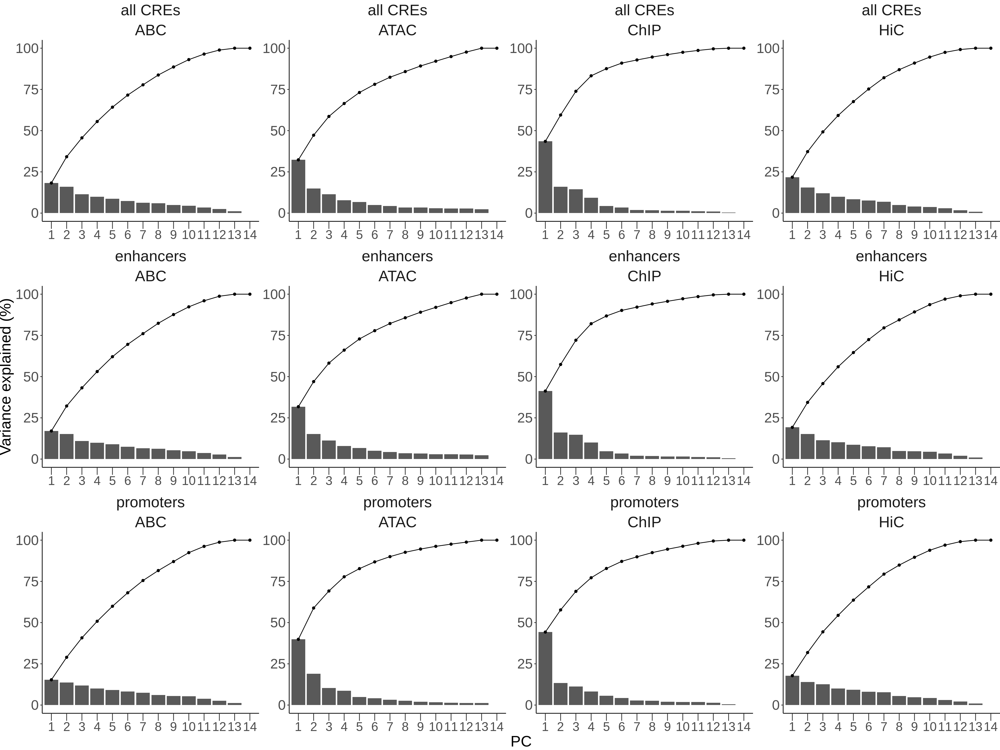

In [64]:
options(repr.plot.width = 20, repr.plot.height = 15, repr.plot.res = 200)
pca_abc$evplot

Warning message:
“ggrepel: 12 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 11 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 12 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 12 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 11 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 9 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


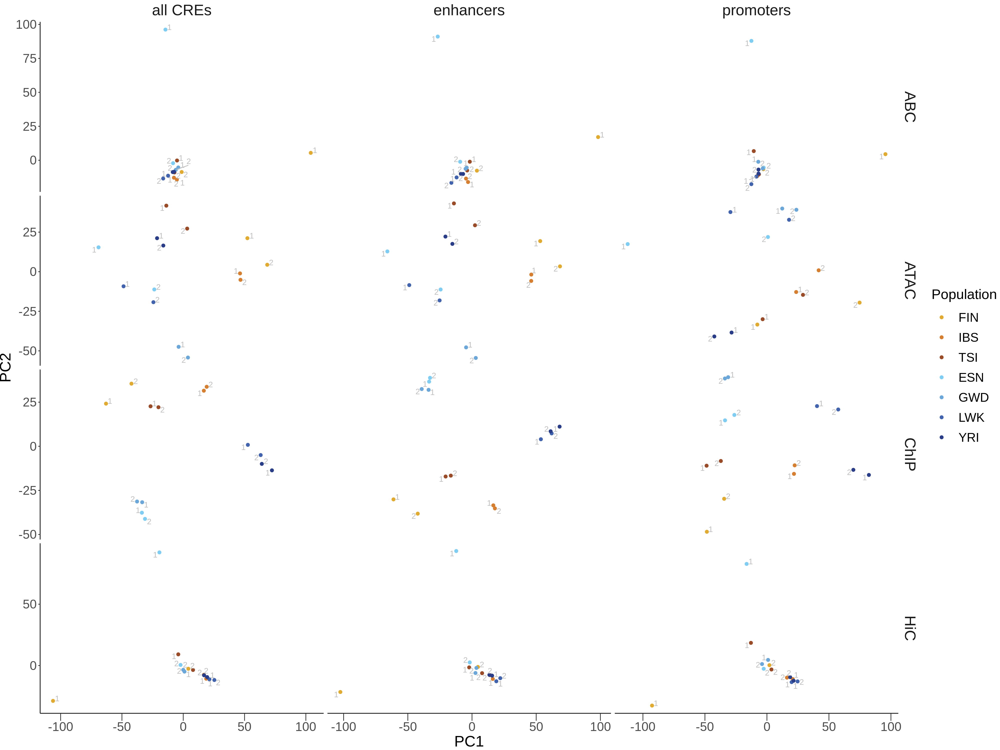

In [65]:
pca_abc$pcaplot

Warning message:
“ggrepel: 12 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 9 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 12 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 10 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 11 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


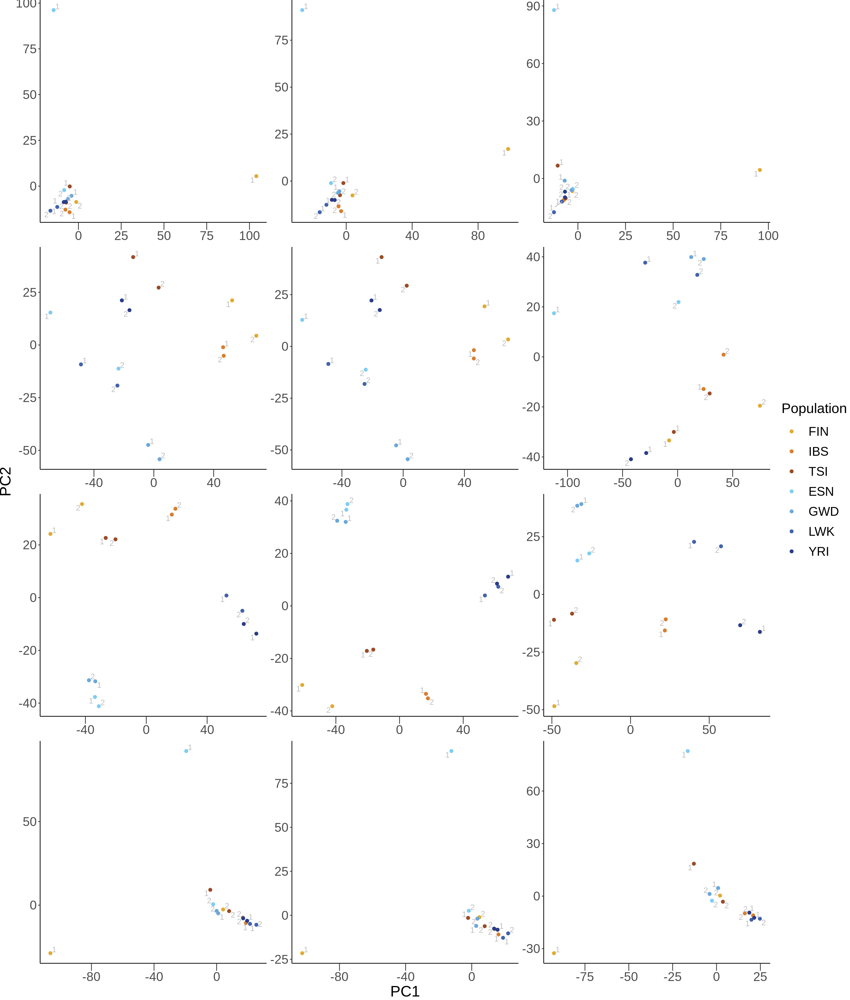

In [66]:
options(repr.plot.width = 17, repr.plot.height = 20, repr.plot.res = 200)

pca_abc$scores %>%  
    ggplot(aes(x = PC1, y = PC2, color=hex)) +
    geom_point(size=2) + 
    scale_color_identity(breaks=pca_abc$scores$hex, labels=pca_abc$scores$population, guide='legend') +  
    labs(color='Population') + 
    ggrepel::geom_text_repel(
            aes(label=replicate, color='gray'),
            size=4,
            show.legend=FALSE,
            box.padding=.075
        ) + 
    theme_classic() + 
    facet_wrap(vars(CRE_type, score_type), nrow=4, dir='v', scales='free') + 
    theme(axis.text.x = element_text(size=18),
          axis.text.y = element_text(size=18),
          axis.ticks.length.x = unit(0.75, "line"),
          axis.title.x = element_text(size=22),
          axis.title.y = element_text(size=22),
          legend.position = 'right',
          legend.title = element_text(size=20),
          legend.text = element_text(size=18),
          legend.key.size = unit(2.0, "line"),
          legend.background = element_rect(fill = "transparent",colour = NA),
          legend.box.background = element_rect(fill = "transparent",colour = NA),
              strip.background = element_blank(),
              strip.placement = "outside",
#               strip.text = element_text(size=22),
              strip.text = element_blank(),
          panel.background = element_rect(fill = "transparent",colour = NA),
          plot.title=element_text(size=24),
          plot.background = element_rect(fill = "transparent",colour = NA),
          plot.margin = unit(c(0,0,0,0),"line"))

if (save_figs) {
    ggsave(
        file.path(
            outdir, 
            'FigS1b.png'
        ),
        width=17, 
        height=20
    )
}

# Fig. 1

## c

In [67]:
pca_abc$scores

sample,population,replicate,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,ancestry,hex,porder,CRE_type,score_type
<fct>,<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<int>,<chr>,<chr>
FIN_rep2,FIN,2,-1.278935,-8.6718190,-3.044221,2.47107370,-12.05869338,-15.7276553,-1.4776979,5.3631412,6.32790233,-43.05395981,16.99910176,-8.70140073,1.241553e+00,-2.726985e-15,EUR,#E1AB31,14,all CREs,ABC
FIN_rep1,FIN,1,104.006915,5.4363361,4.328091,-1.25500926,5.30203710,1.1136669,0.4392133,-3.9951855,-0.22717922,1.84122857,-0.01413326,0.91309371,9.389847e-02,1.024181e-14,EUR,#E1AB31,13,all CREs,ABC
IBS_rep2,IBS,2,-7.591611,-12.8528855,7.404833,-7.66151602,2.14229743,-2.9067439,-1.8044734,9.5231899,-2.54077117,-17.30022308,-26.16588412,26.54481319,1.058429e+00,-1.804112e-16,EUR,#D67F30,12,all CREs,ABC
IBS_rep1,IBS,1,-5.177587,-14.2838846,16.952443,-13.91276343,6.70015269,1.3572572,-4.4670488,47.2421557,9.49039510,16.67215681,15.96764279,3.08091958,4.875865e-01,5.093148e-15,EUR,#D67F30,11,all CREs,ABC
TSI_rep2,TSI,2,-7.178671,-8.9784030,-10.067407,-1.91522861,-9.38898556,-47.5194256,35.7465242,-7.4249407,1.21890696,15.38480871,-0.89696660,0.68196413,-8.534567e-02,-1.811051e-15,EUR,#9A4C28,10,all CREs,ABC
TSI_rep1,TSI,1,-5.066398,-0.1838001,-77.207632,-18.83314883,11.57771198,13.1792699,-5.2633938,0.9067357,1.03928222,2.65822191,1.03624835,0.44599537,1.502034e-01,-6.647460e-15,EUR,#9A4C28,9,all CREs,ABC
ESN_rep2,ESN,2,-8.310574,-2.1736437,-7.459887,72.79280833,21.29910810,3.4831314,-1.2497852,2.7463591,1.57313368,3.49871020,0.82025181,1.94917809,3.583105e-01,-1.605140e-14,AFR,#7FCDF3,8,all CREs,ABC
ESN_rep1,ESN,1,-14.508949,96.1624259,8.522913,-5.14359888,1.12878446,-1.7382874,0.4519374,1.6704664,0.37304918,-0.65233803,0.52836692,1.28120194,5.539143e-02,-3.136380e-15,AFR,#7FCDF3,7,all CREs,ABC
GWD_rep2,GWD,2,-6.081231,-7.0450216,1.910991,3.19150070,-32.19216496,-18.1986379,-46.8890837,-14.6541615,1.08700785,13.72823153,0.59685540,1.40251672,3.267761e-01,1.360023e-15,AFR,#6CA7DA,6,all CREs,ABC


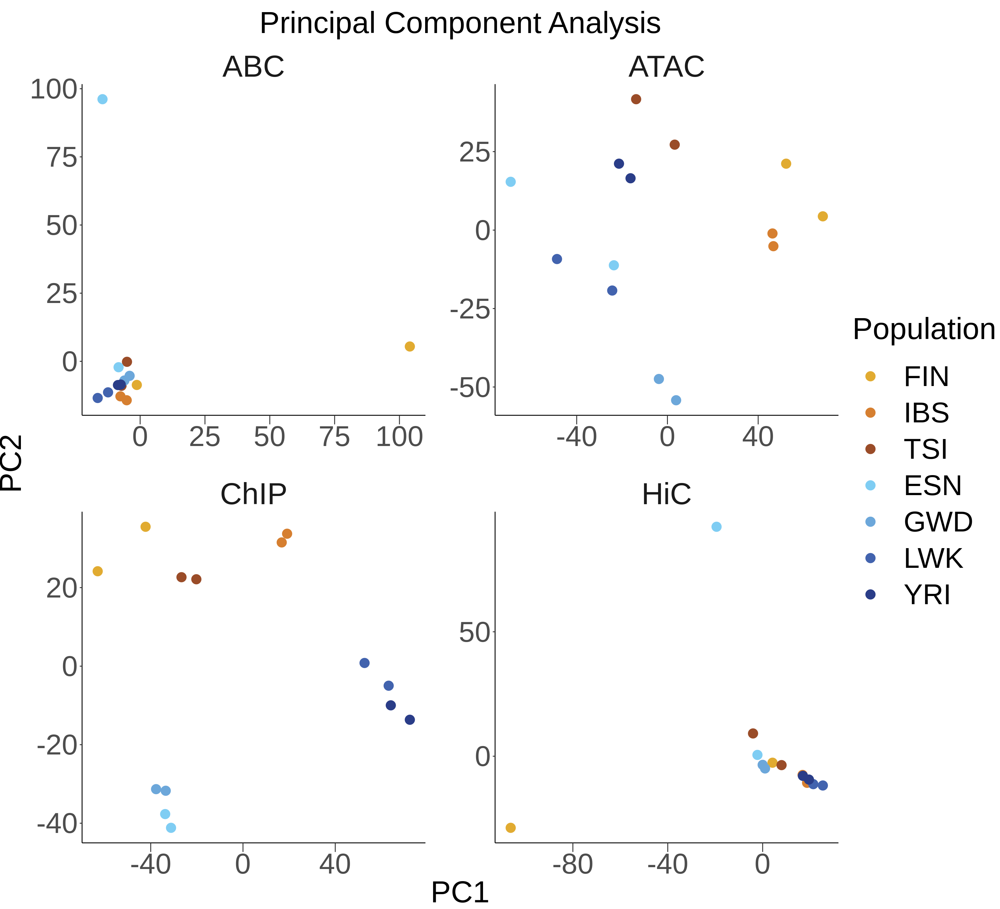

In [95]:
options(repr.plot.width = 16.5, repr.plot.height = 15, repr.plot.res = 200)

titlesize <- 36
textsize <- 34

pca_abc$scores %>% 
    filter(CRE_type=='all CREs') %>% 
    ggplot(aes(x = PC1, y = PC2, color=hex)) +
    geom_point(size=5) + 
#     ggrepel::geom_text_repel(
#             aes(label=replicate, 
# #                 color='gray'
#                ),
#             size=5,
#             show.legend=FALSE,
#             box.padding=.09
#         ) + 
    scale_color_identity(breaks=pca_abc$scores$hex, labels=pca_abc$scores$population, guide='legend') +  
    labs(color='Population') + 
    theme_classic() + 
    facet_wrap(vars(score_type), nrow=2, dir='h', scales='free') + 
    theme(axis.text.x = element_text(size=textsize),
          axis.text.y = element_text(size=textsize),
          axis.ticks.length.x = unit(0.75, "line"),
          axis.title.x = element_text(size=titlesize),
          axis.title.y = element_text(size=titlesize),
          legend.position = 'right',
          legend.title = element_text(size=titlesize),
          legend.text = element_text(size=textsize),
          legend.key.size = unit(3.0, "line"),
          legend.background = element_rect(fill = "transparent",colour = NA),
          legend.box.background = element_rect(fill = "transparent",colour = NA),
              strip.background = element_blank(),
              strip.placement = "outside",
#               strip.text = element_text(size=22),
              strip.text = element_text(size=titlesize),
          panel.background = element_rect(fill = "transparent",colour = NA),
          panel.spacing = unit(2, 'line'),
          plot.title=element_text(size=titlesize),
          plot.background = element_rect(fill = "transparent",colour = NA),
          plot.margin = unit(c(1,0,0,0),"line")) + 
    ggtitle("Principal Component Analysis") +
        theme(plot.title = element_text(size=titlesize, hjust=.5, margin=margin(0,0,10,0)))

if (save_figs) {
    ggsave(
        file.path(
            outdir, 
            'Fig1c.png'
        ),
        width=16.5, 
        height=15
    )
}

In [69]:
if (pca_only) stop('Not run: heatmaps')

# heatmap function

In [70]:
sampScoreHeatmap <- function(df, 
                             score_column='ABC.Score', 
                             cre_types=c('promoter','enhancer'), 
                             top_abc=FALSE,
                             plotlog=FALSE,
                             hic_filt=FALSE,
                             scaledir='none',
                             zscore=FALSE,
                             topvar=NULL,
                             ordervar='mean_score',
                             cluster_cols=FALSE,
                             showlegend=TRUE,
                             cv_exclude_pop=NULL,
                             showtitle=FALSE,
                             debug=FALSE) {
    
    ptitle <- gsub("\\."," ", score_column)
    
    sampinfo <- df %>% 
        select(population,ancestry,sample) %>% 
        distinct() %>% 
        column_to_rownames("sample")
    
    abcw <- df %>% 
        mutate(egpair = paste(name, TargetGene, sep=';'),
               CRE_type = if_else(class=='promoter','promoter','enhancer')) %>% 
        dplyr::filter(CRE_type %in% cre_types)
    
    if (hic_filt) {
        
        abcw <- abcw %>% 
            # for compatibility with previous bug, 
            # remove NA hic_estimates for all score types
            group_by(egpair) %>% 
            filter(all(!is.na(hic.Score)))
        
    }
    
    if (top_abc) {
        
        abcw <- abcw %>% 
            group_by(egpair) %>% 
            mutate(mean_ABC = mean(ABC.Score, na.rm=TRUE)) %>% 
            group_by(sample, TargetGene) %>% 
            arrange(desc(mean_ABC), .by_group=TRUE) %>% 
            slice(1)
        
    }
    
    abcw <- abcw %>% 
        ungroup() %>% 
        rename(test.Score := {{score_column}})
    
    abcw <- abcw %>% 
        select(sample, CRE_type, egpair, test.Score) %>% 
        group_by(egpair) %>% 
        mutate(mean_score=mean(test.Score, na.rm=TRUE))
    
    # allow coefficient of variance calculation for E-G pair inclusion filtering
    # to exclude single pop/sample that could driving the top CV pairs
    if (!is.null(cv_exclude_pop)) {
        abcw <- abcw %>% 
            mutate(test_cv = sd(test.Score[population!=cv_exclude_pop], na.rm=TRUE)/mean(test.Score[population!=cv_exclude_pop], na.rm=TRUE))
    } else {
        abcw <- abcw %>% 
            mutate(test_cv = sd(test.Score, na.rm=TRUE)/mean_score)
    }

    
    if (zscore) {
        abcw <- abcw %>% 
            mutate(test.Score = (test.Score - mean_score)/sd(test.Score, na.rm=TRUE))
    }
    
    abcw <- abcw %>% 
        ungroup() %>% 
        pivot_wider(names_from = sample,
                    values_from = test.Score) %>% 
        filter(if_all(everything(), ~ !is.na(.)))
    
    if (!is.null(topvar)) {
        
        abcw <- abcw %>% 
            arrange(desc(test_cv)) %>% 
            head(topvar)
        
    }
    
    abcw <- abcw %>% 
        arrange(desc(.data[[ordervar]]))
    
    if (debug) return(abcw)
    
    # annotate columns by CRE type
    eginfo <- abcw %>% 
        select(egpair, CRE_type) %>% 
        column_to_rownames("egpair")
    
    if (length(cre_types)==1) {
#         eginfo <- NA
        ptitle <- paste(cre_types, ptitle)
    }
    
    abcw <- abcw %>% 
        select(-c(CRE_type, mean_score, test_cv))
    
    abcwt <- abcw %>% 
        column_to_rownames("egpair") %>% 
        as.matrix() %>% 
        t()
    
    # set colors and legend order
    pclrs <- popPlotColors(pops=unique(sampinfo$population))
    r1colors <- pclrs %>% 
        dplyr::filter(replicate=='rep1') %>% 
        select(-replicate)
    
    sampinfo <- sampinfo %>% 
        mutate(population = factor(population, levels=r1colors$population))
    
    popcolorv <- r1colors %>% pull(hex)
    names(popcolorv) <- r1colors %>% pull(population)
    
    abccolors <- list(
        population = popcolorv,
        ancestry = c(AFR = "#2E3191", EUR = "#F05A28"),
        CRE_type = c(promoter = "#739893", enhancer = "#DF241B")
    )
    
    # annotate rows by ancestry and population
    # may not be necessary, but ensure same ordering going in
    sampinfo <- sampinfo[rownames(abcwt),]
    
    if (plotlog) abcwt <- log(abcwt)
    if (!showtitle) ptitle <- NA
    
    ph <- pheatmap::pheatmap(abcwt,
                             color=colorRampPalette(RColorBrewer::brewer.pal(n = 9, name = "PRGn"))(100),
                             main=ptitle, 
                             show_colnames=FALSE,
                             cluster_cols=cluster_cols,
                             annotation_col=eginfo,
                             annotation_row=sampinfo,
                             annotation_colors=abccolors,
                             fontsize=18,
                             scale=scaledir,
                             annotation_legend=showlegend,
                             annotation_names_row=FALSE,
                             annotation_names_col=FALSE)
    
    return(ph)
        
}

In [71]:
tp <- sampScoreHeatmap(abc, 
                            score_column='atac.Score', 
                            debug=TRUE, 
                            plotlog=TRUE,
                            cre_type=c('enhancer','promoter'),
                            scaledir='none',
                        cv_exclude_pop=cv_exclude_pop,
                        zscore=zscore, 
                           topvar=NULL,
                           cluster_cols=colClust)
head(tp)

CRE_type,egpair,mean_score,test_cv,ESN_rep1,ESN_rep2,FIN_rep1,FIN_rep2,GWD_rep1,GWD_rep2,IBS_rep1,IBS_rep2,LWK_rep1,LWK_rep2,TSI_rep1,TSI_rep2,YRI_rep1,YRI_rep2
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
promoter,promoter|chr3:88107896-88108396;C3orf38,0.5397631,0.01020596,0.2331364,-0.5976167,0.3070329,1.294130,0.394163434,0.9672191,1.4655918,0.9459466,0.03356049,0.09925932,-1.3696348,-1.22247428,-1.437076,-1.1132382
promoter,promoter|chr3:88107896-88108396;CGGBP1,0.5397631,0.01020596,0.2331364,-0.5976167,0.3070329,1.294130,0.394163434,0.9672191,1.4655918,0.9459466,0.03356049,0.09925932,-1.3696348,-1.22247428,-1.437076,-1.1132382
promoter,promoter|chr3:88107896-88108396;ZNF654,0.5397631,0.01020596,0.2331364,-0.5976167,0.3070329,1.294130,0.394163434,0.9672191,1.4655918,0.9459466,0.03356049,0.09925932,-1.3696348,-1.22247428,-1.437076,-1.1132382
promoter,promoter|chrX:30671225-30671725;CXorf21,0.4028649,0.02768449,-0.3005472,1.5749766,-1.0149938,1.202511,0.005351497,0.4173404,0.7952440,1.5972735,-1.47222595,-0.13003010,-0.7454191,-0.05134781,-1.149593,-0.7285395
promoter,promoter|chrX:30671225-30671725;GK,0.4028649,0.02768449,-0.3005472,1.5749766,-1.0149938,1.202511,0.005351497,0.4173404,0.7952440,1.5972735,-1.47222595,-0.13003010,-0.7454191,-0.05134781,-1.149593,-0.7285395
promoter,promoter|chrX:30671225-30671725;TAB3,0.4021584,0.02763463,-0.2967779,1.5820551,-1.0384665,1.222428,-0.012868554,0.3956655,0.8190268,1.5612340,-1.47232340,-0.12115640,-0.7371433,-0.02803009,-1.148314,-0.7253294


[1] "0 potentially repeated, non-finite elements dropped"


`geom_smooth()` using formula 'y ~ x'

Warning message:
“Computation failed in `stat_smooth()`:
'what' must be a function or character string”


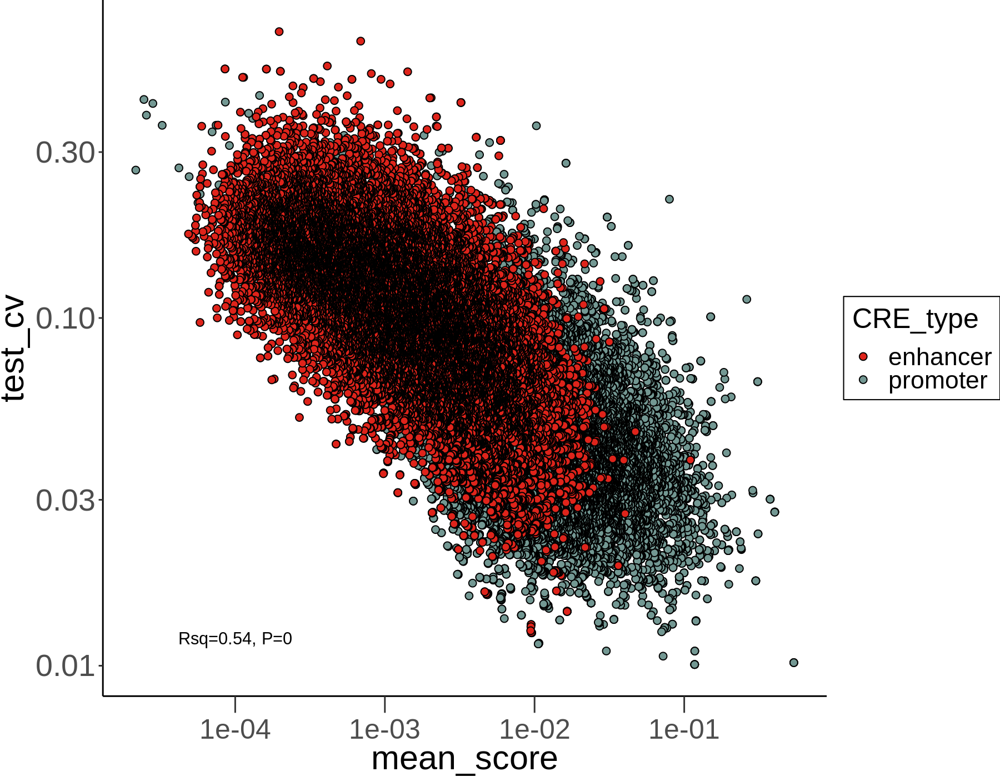

In [72]:
cre_colors <- c("#DF241B","#739893")

plotCorrelation(tp %>% 
                    arrange(desc(CRE_type)),
                'mean_score',
                'test_cv',
                xangle=0,
                groupvar='CRE_type',
                colorvals=cre_colors,
                addline=NULL, # c(intercept, slope)
                legendpos="right",
                corrpos=c(1e-4,.012),
                corrcolor='black',
                w=9,h=7,
                logscale=TRUE,
                xlogonly=FALSE,
                facets=NULL,
                fscales='fixed', # free, free_x, free_y
                frows=2,
                fdir='h',
                orderpval=FALSE,
                addaxes=FALSE,
                debug=FALSE)

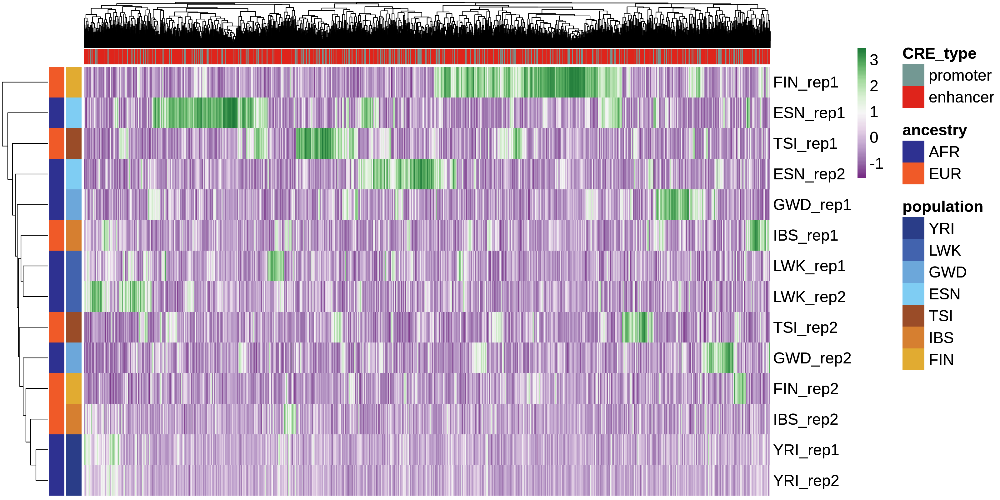

In [73]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_abc <- sampScoreHeatmap(abc, 
                           score_column='ABC.Score', 
                           debug=FALSE, 
                           plotlog=FALSE, 
                           scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=TRUE)
ph_abc

In [74]:
names(ph_abc)

[1] "tree_row" "tree_col" "kmeans"   "gtable"

In [75]:
colorRampPalette(rev(RColorBrewer::brewer.pal(n = 9, name = "Greens")))(100)

[1] "#00441B" "#00471C" "#004A1D" "#004D1F" "#005120" "#005421" "#005723"
  [8] "#005B24" "#005E25" "#006127" "#006528" "#00682A" "#006B2B" "#016E2D"
 [15] "#04702F" "#077331" "#0A7533" "#0D7835" "#0F7A37" "#127D39" "#157F3B"
 [22] "#18813D" "#1B843F" "#1E8641" "#208943" "#238B45" "#268E47" "#289049"
 [29] "#2A934B" "#2D954D" "#2F984F" "#329B51" "#349D53" "#37A055" "#39A256"
 [36] "#3BA558" "#3EA85A" "#40AA5C" "#44AC5E" "#48AE60" "#4CB062" "#50B264"
 [43] "#55B466" "#59B668" "#5DB86A" "#61BA6C" "#65BC6E" "#69BE70" "#6DC072"
 [50] "#71C274" "#75C477" "#79C67A" "#7DC87D" "#80C980" "#84CB83" "#88CD86"
 [57] "#8BCF89" "#8FD08C" "#92D28F" "#96D492" "#9AD595" "#9DD798" "#A1D99B"
 [64] "#A4DA9E" "#A7DBA1" "#AADDA4" "#ADDEA7" "#B0DFAA" "#B3E0AD" "#B6E2B0"
 [71] "#B9E3B3" "#BDE4B6" "#C0E6B9" "#C3E7BC" "#C6E8BF" "#C8E9C1" "#CBEAC4"
 [78] "#CDEBC7" "#D0ECC9" "#D2EDCC" "#D4EECE" "#D7EFD1" "#D9F0D4" "#DCF1D6"
 [85] "#DEF2D9" "#E1F3DB" "#E3F4DE" "#E5F5E0" "#E7F5E2" "#E8F6E4" "#E9F6E5"
 [92] "#EBF7E7" "#ECF8E9" "#EEF8EA" "#EFF9EC" "#F1F9EE" "#F2FAEF" "#F4FAF1"
 [99] "#F5FBF3" "#F7FCF5"

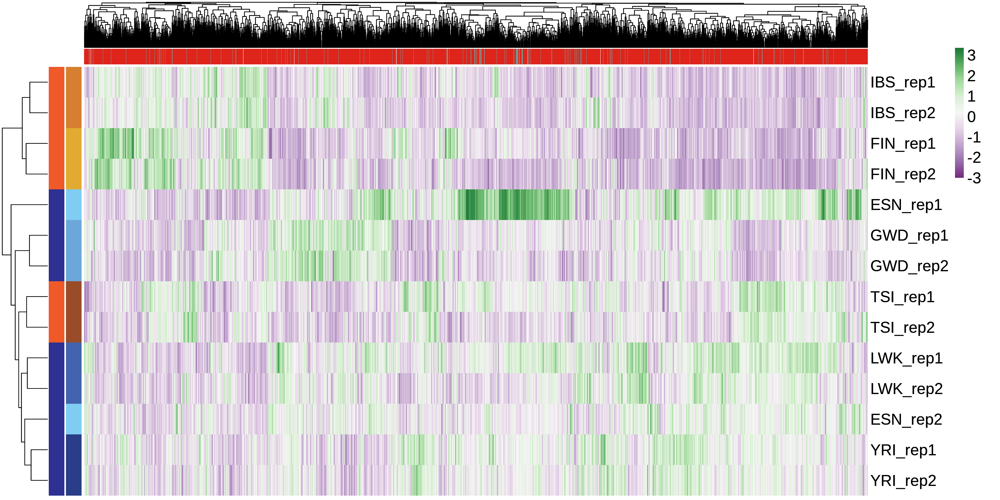

In [76]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_atac <- sampScoreHeatmap(abc, 
                            score_column='atac.Score', 
                            debug=FALSE, 
                            plotlog=FALSE, 
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_atac

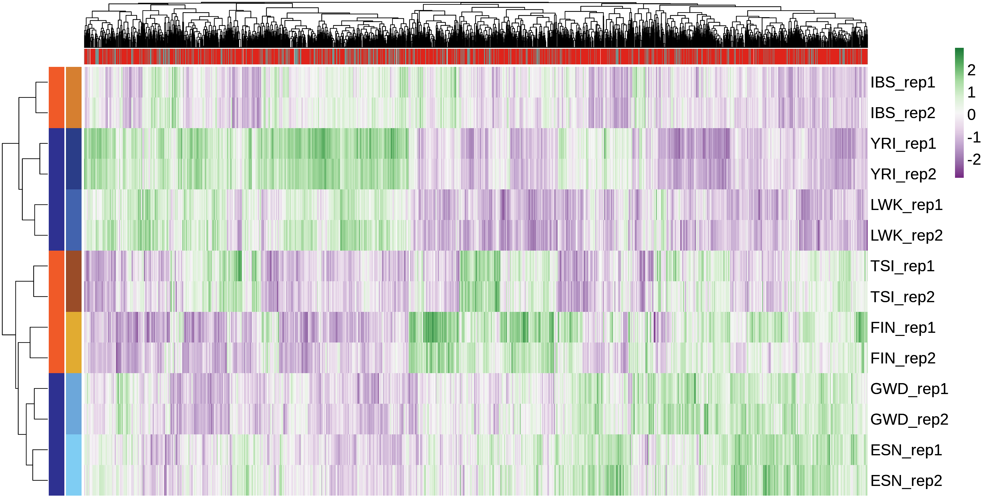

In [77]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_chip <- sampScoreHeatmap(abc, 
                            score_column='chip.Score', 
                            debug=FALSE, 
                            plotlog=FALSE, 
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_chip

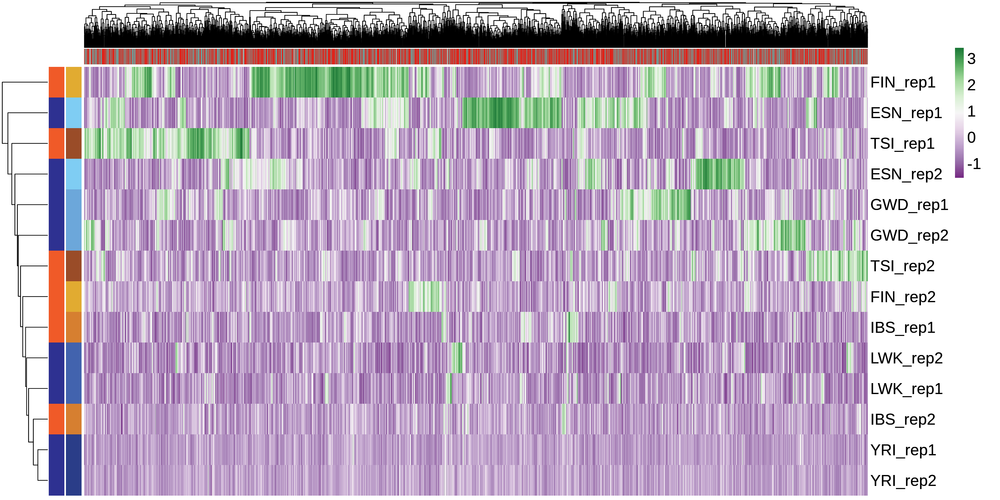

In [78]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_hic <- sampScoreHeatmap(abc, 
                            score_column='hic.Score', 
                            debug=FALSE, 
                            plotlog=FALSE, 
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_hic

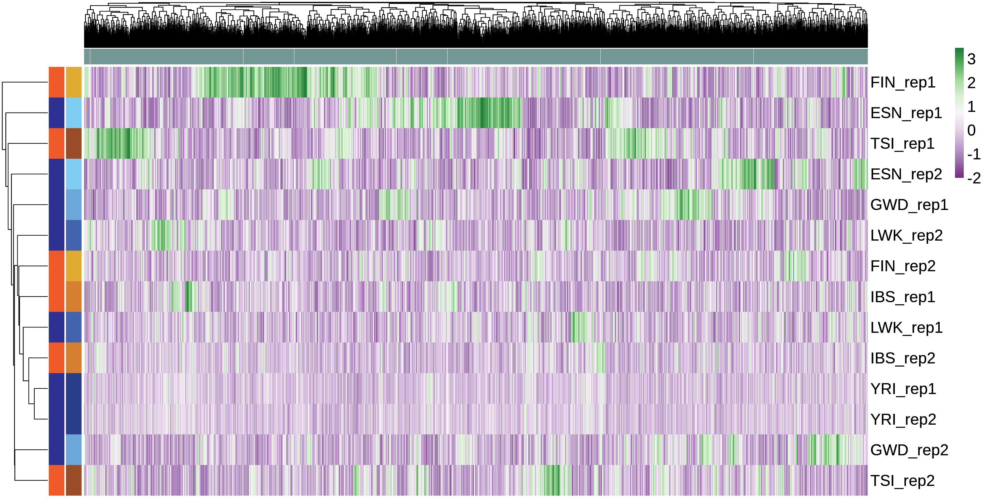

In [79]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_abcp <- sampScoreHeatmap(abc, 
                            score_column='ABC.Score', 
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='promoter',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_abcp

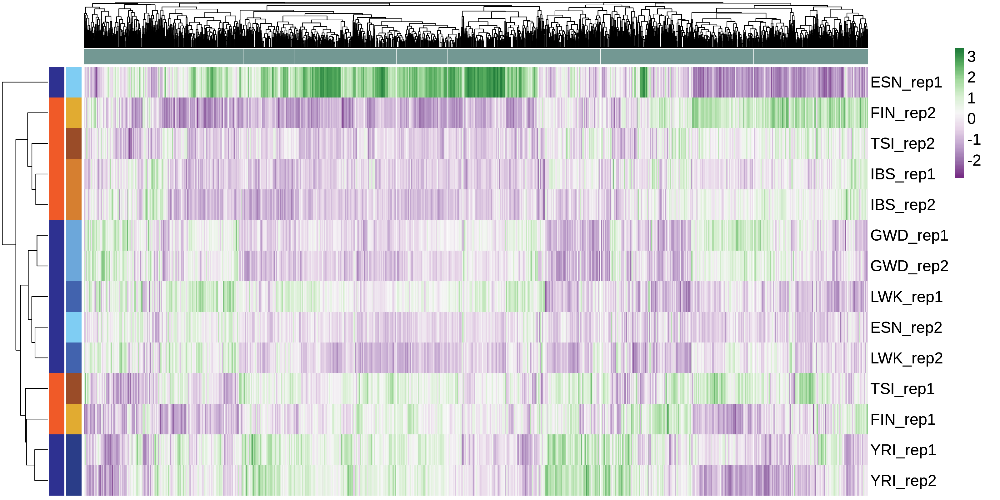

In [80]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_atacp <- sampScoreHeatmap(abc, 
                            score_column='atac.Score', 
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='promoter',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_atacp

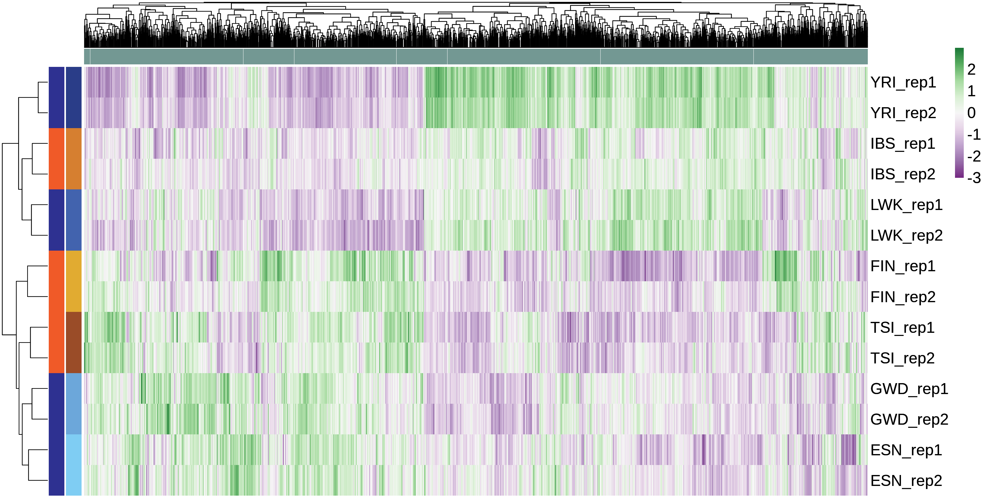

In [81]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_chipp <- sampScoreHeatmap(abc, 
                            score_column='chip.Score', 
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='promoter',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_chipp

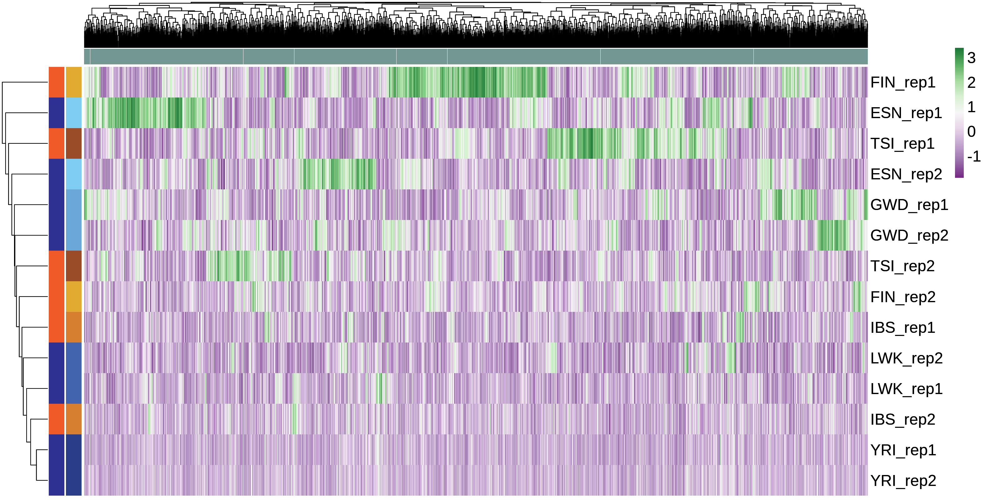

In [82]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_hicp <- sampScoreHeatmap(abc, 
                            score_column='hic.Score', 
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='promoter',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_hicp

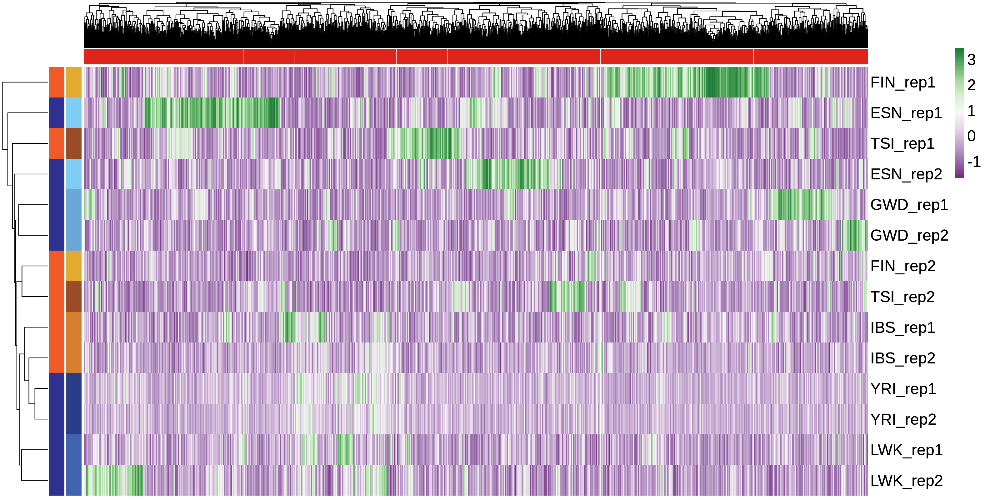

In [83]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_abce <- sampScoreHeatmap(abc, 
                            score_column='ABC.Score', 
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='enhancer',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_abce

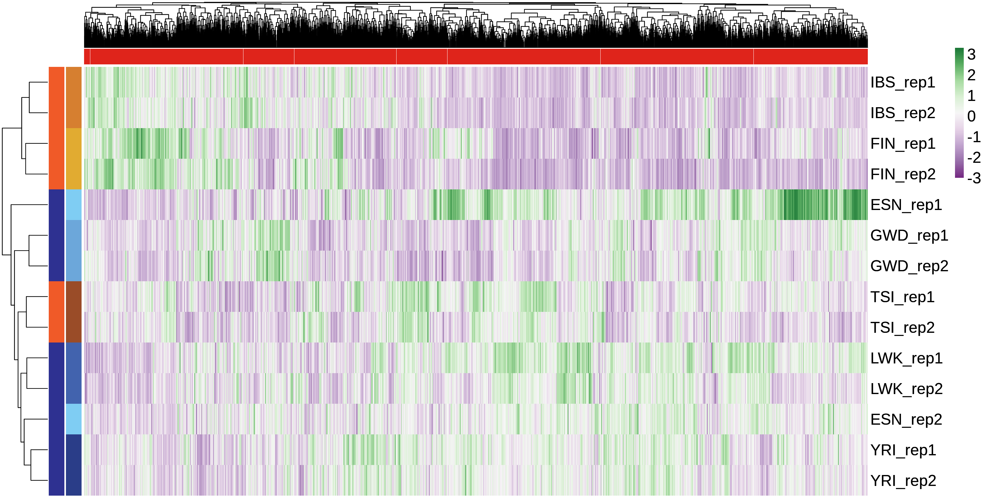

In [84]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_atace <- sampScoreHeatmap(abc, 
                            score_column='atac.Score', 
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='enhancer',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_atace

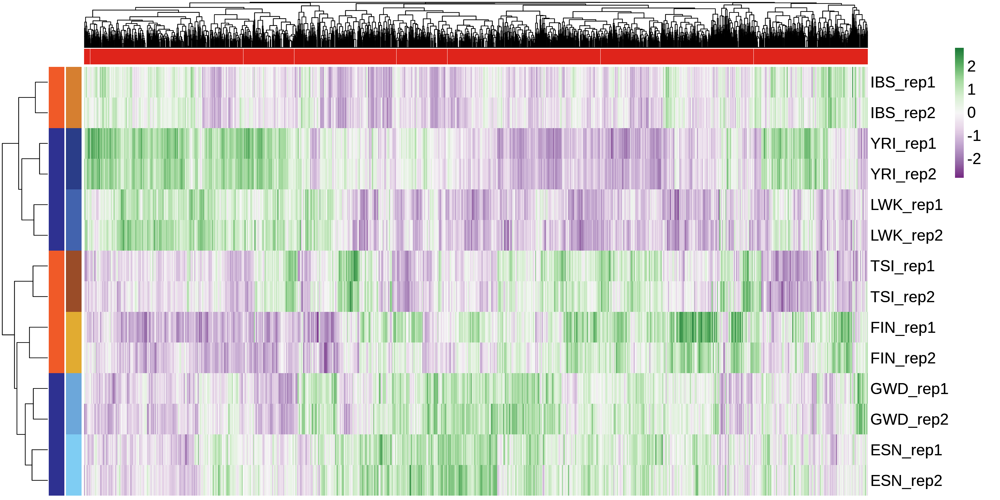

In [85]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_chipe <- sampScoreHeatmap(abc, 
                            score_column='chip.Score', 
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='enhancer',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_chipe

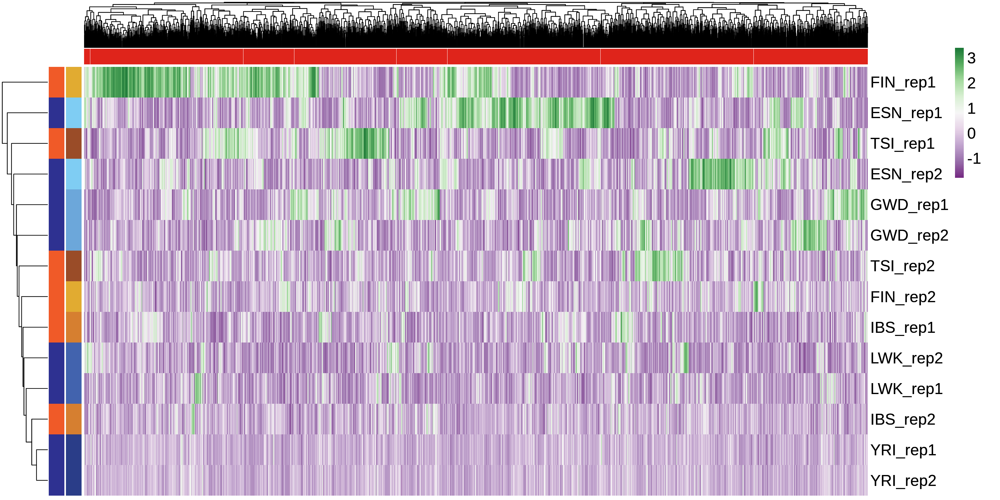

In [86]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_hice <- sampScoreHeatmap(abc, 
                            score_column='hic.Score', 
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='enhancer',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_hice

In [87]:
names(ph_chipe)

[1] "tree_row" "tree_col" "kmeans"   "gtable"

In [88]:
lm <- cbind(seq(1,4),
            seq(5,8),
            seq(9,12))
lm

1,5,9
2,6,10
3,7,11
4,8,12


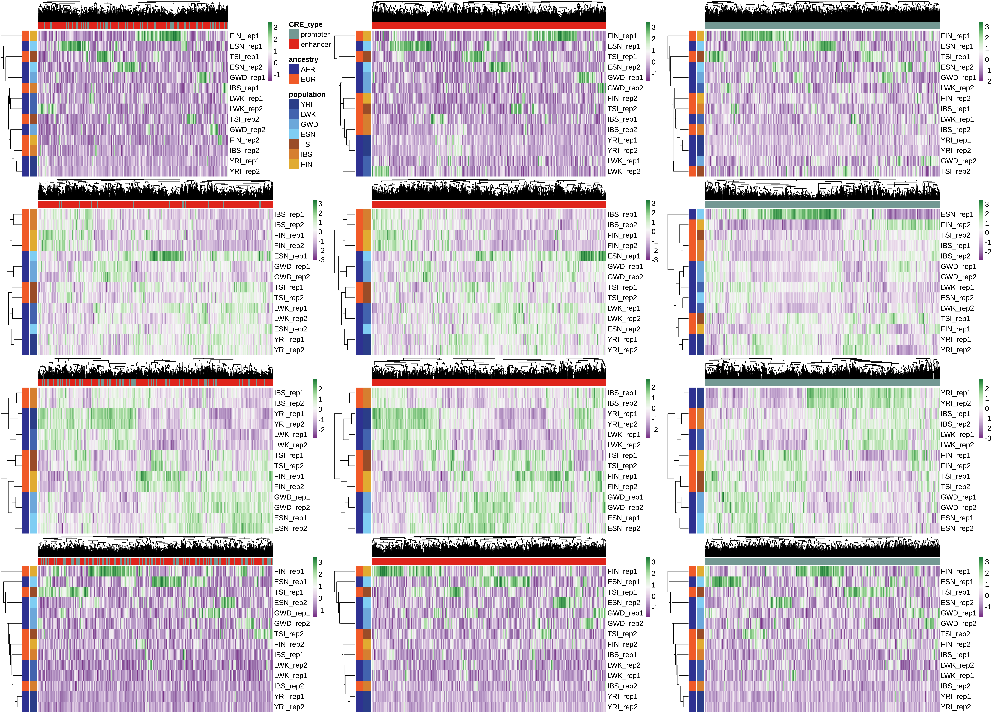

In [89]:
# g1 <- gridExtra::grid.arrange(
#       p1 + theme(plot.margin = unit(c(0,3,0,0),"line")),
#       p2 + theme(plot.margin = unit(c(0,1.5,0,0),"line")),
#       nrow = 1,
#       top = grid::textGrob(
#            gtitle,
#            gp = grid::gpar(fontsize = 26)
#       ),
#       padding = unit(3, "line")
#     )

lm <- cbind(seq(1,4),
            seq(5,8),
            seq(9,12))

grobslist <- list(
    ph_abc$gtable,
    ph_atac$gtable,
    ph_chip$gtable,
    ph_hic$gtable,
    ph_abce$gtable,
    ph_atace$gtable,
    ph_chipe$gtable,
    ph_hice$gtable,
    ph_abcp$gtable,
    ph_atacp$gtable,
    ph_chipp$gtable,
    ph_hicp$gtable
)

options(repr.plot.width = 35, repr.plot.height = 25, repr.plot.res = 200)

g1 <- gridExtra::grid.arrange(grobs = grobslist,
                                layout_matrix = lm)

grid::grid.draw(g1)

if (save_figs) {
    ggsave(
        file.path(
            outdir, 
            'FigS1c.png'
        ), 
        plot=g1, 
        width=35, 
        height=25
    )
}